# Student Performance Project

The goal of this project is to find the student behaviors and characteristics that predict school performance.

Data for this project: The data used in this project was downloaded from Student Performance Data on Kaggle: https://www.kaggle.com/datasets/nasirayub2/spd24-student-performance-data-revised-features. The data was originally collected from univeristies and schools in China.

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

#Set the plotting style.
sns.set_style("whitegrid")

In [3]:
### Importing Libraries for Statistical Modeling and Evaluation

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

import statsmodels.formula.api as smf
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from statsmodels.stats.anova import anova_lm

### Load the dataset

In [11]:
student_data = pd.read_excel('/Users/hamdahassan/DATA5100-group-project/data/Student_Performance_Data(SPD24).xlsx')

In [ ]:
student_data = pd.read_excel(r"C:\Users\jenpo\Documents\Jen\Seattle University\DATA 5300 Statistical Inference and Experimental Design\DATA5100-group-project\data\Student_Performance_Data(SPD24).xlsx")
student_data.head()

### Explore the contents of the dataset
- Checking for nulls, duplicates, etc.
- Checking for extreme outliers. None exist, which means there is no need to drop or escale anything.

In [ ]:
student_data.head()

### Examine all the columns

In [ ]:
pd.set_option('display.max_columns', None)
student_data.head()

Performance Score is high, medium or low. Reading, Math, Science, and Language Proficiency seem to be on a scale that goes up to 100.

### About the dataset
- We don't have any missing values in any of the rows.
- Data includes both numerical and categorical variables.

In [13]:
student_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98000 entries, 0 to 97999
Data columns (total 41 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Student ID                       98000 non-null  int64  
 1   Gender                           98000 non-null  object 
 2   Age                              98000 non-null  int64  
 3   Grade Level                      98000 non-null  int64  
 4   Attendance Rate                  98000 non-null  float64
 5   Study Hours                      98000 non-null  float64
 6   Parental Education Level         98000 non-null  object 
 7   Parental Involvement             98000 non-null  object 
 8   Extracurricular Activities       98000 non-null  object 
 9   Socioeconomic Status             98000 non-null  object 
 10  Previous Academic Performance    98000 non-null  float64
 11  Class Participation              98000 non-null  object 
 12  Health Status     

In [18]:
student_data.duplicated().sum()

np.int64(0)

In [20]:
student_data.describe()

,Student ID,Age,Grade Level,Attendance Rate,Study Hours,Previous Academic Performance,Hours of Sleep,Homework Completion Rate,Reading Proficiency,Math Proficiency,Science Proficiency,Language Proficiency,Screen Time,Bullying Incidents,Household Size
count,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000
mean,49000.500000,16.001949,10.498245,87.529836,2.996621,80.055114,7.003390,79.981318,79.939456,79.944700,80.019677,80.004838,2.504328,1.996735,3.993878
std,28290.307527,1.415319,1.116604,7.220848,1.153689,11.531197,1.156349,11.545166,11.540462,11.552735,11.530846,11.543158,0.864795,1.419676,1.413414
min,1.000000,14.000000,9.000000,75.000057,1.000009,60.002122,5.000038,60.000437,60.000427,60.001036,60.000204,60.000327,1.000027,0.000000,2.000000
25%,24500.750000,15.000000,10.000000,81.279963,1.995280,70.127310,5.999395,69.927298,69.917734,69.942322,70.029975,70.053283,1.759772,1.000000,3.000000
50%,49000.500000,16.000000,10.000000,87.528388,2.994967,80.055771,7.006930,79.996518,79.932998,79.956681,80.011503,79.959596,2.508170,2.000000,4.000000
75%,73500.250000,17.000000,11.000000,93.771893,3.995063,90.036651,8.004904,89.977932,89.882934,89.903344,90.015863,89.994592,3.251803,3.000000,5.000000
max,98000.000000,18.000000,12.000000,99.999482,4.999978,99.999797,8.999964,99.998589,99.999538,99.999266,99.999967,99.999453,3.999930,4.000000,6.000000


This confirms that the Reading, Math, Science, and Language Proficiency scores come close to 100 but do not go over.

Rename the columns with simple, informative names in snake case.

In [ ]:
student_data = student_data.rename(
    columns = {'Student ID': 'id',
               'Gender': 'gender',
               'Age': 'age',
               'Grade Level': 'grade',
               'Attendance Rate': 'attendance',
               'Study Hours': 'hours_study_daily',
               'Parental Education Level': 'parent_education',
               'Parental Involvement': 'parent_involvement',
               'Extracurricular Activities': 'activities',
               'Socioeconomic Status': 'socioeconomic_status',
               'Previous Academic Performance': 'previous_performance',
               'Class Participation': 'class_participation',
               'Health Status': 'health',
               'Access to Learning Resources': 'resources',
               'Internet Access': 'internet',
               'Learning Style': 'learning_style',
               'Teacher-Student Relationship': 'teacher_relationship',
               'Peer Influence': 'peer_influence',
               'Motivation Level': 'motivation',
               'Hours of Sleep': 'sleep',
               'Diet Quality': 'diet',
               'Transportation Mode': 'transportation',
               'School Type': 'school_type',
               'School Location': 'school_location',
               'Homework Completion Rate': 'homework_completion',
               'Reading Proficiency': 'reading',
               'Math Proficiency': 'math',
               'Science Proficiency': 'science',
               'Language Proficiency': 'language',
               'Physical Activity Level': 'physical_activity',
               'Screen Time': 'screen_time',
               'Bullying Incidents': 'bullied',
               'Special Education Services': 'special_education',
               'Counseling Services': 'counseling',
               'Learning Disabilities': 'learning_disabilities',
               'Behavioral Issues': 'behavioral_issues',
               'Attendance of Tutoring Sessions': 'tutored',
               'School Climate': 'school_climate',
               'Parental Employment Status': 'parents_employment',
               'Household Size': 'household_size',
               'Performance Score': 'performance'
              }
)
               
student_data.head()             


### Exporting the dataset as csv

In [8]:
student_data.to_csv('clean_student_data.csv', index=False)

In [ ]:
student_data.to_csv(r"C:\Users\jenpo\Documents\Jen\Seattle University\DATA 5300 Statistical Inference and Experimental Design\DATA5100-group-project\data\clean_student_data1.csv", index = False)

In [9]:
df = pd.read_csv('clean_student_data.csv')

### Exploring the relationship between Attendence rate and Student performance score

In [55]:
attendance_performance = df[['Attendance Rate', 'Performance Score']]

In [56]:
attendance_performance.head()

,Attendance Rate,Performance Score
0,80.487800,Low
1,96.242678,Medium
2,84.649681,High
3,86.158599,Medium
4,88.487638,Low


In [57]:
attendance_performance.tail()

,Attendance Rate,Performance Score
97995,86.889422,Medium
97996,99.268557,High
97997,84.697214,Medium
97998,81.720266,High
97999,91.174452,Medium


### Relationship between attendance and Performance score
- The mean and median for all the scores are almost identical. This means that student attendance rate alone is not a good predictor of student performance.

In [62]:
attendance_means = attendance_performance.groupby('Performance Score')['Attendance Rate'].agg(['mean', 'median', 'std'])
attendance_means

,mean,median,std
Performance Score,,,
High,87.542683,87.593746,7.215052
Low,87.523737,87.514130,7.232350
Medium,87.520985,87.468477,7.219274


### Explore the relationships among the data

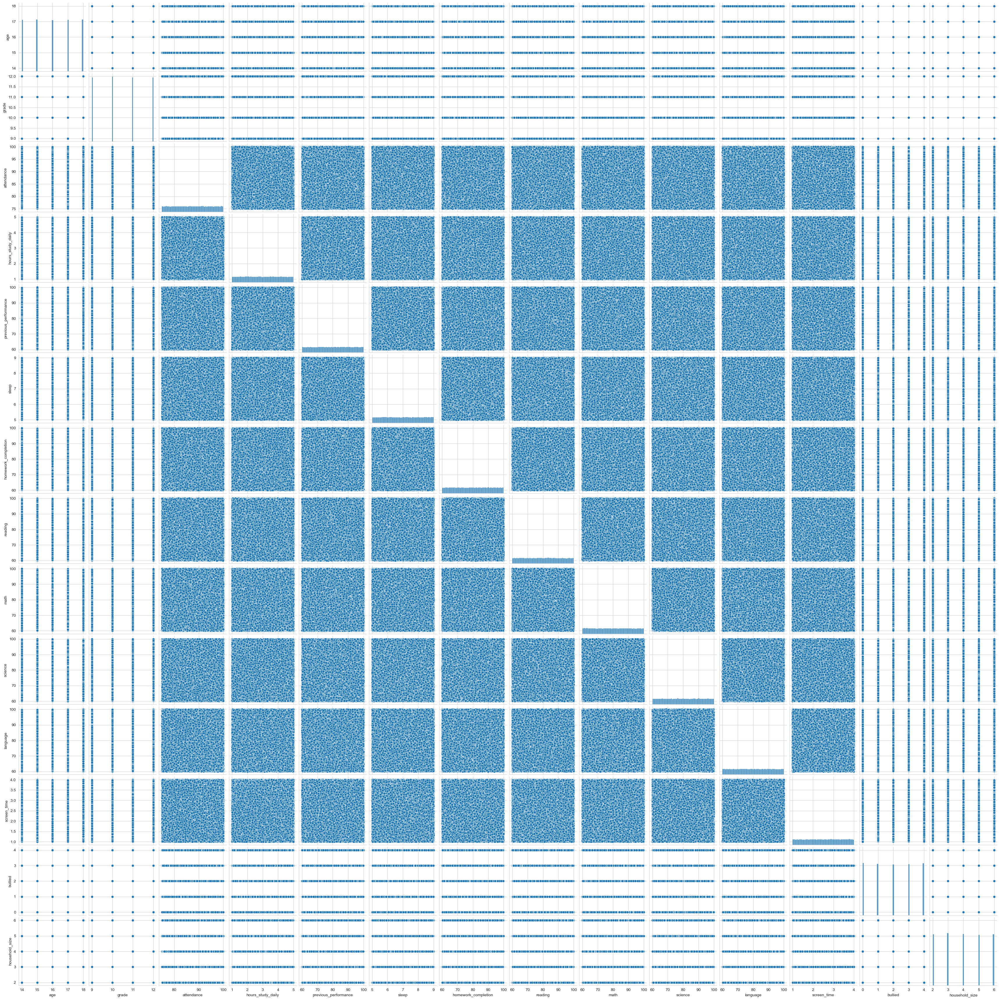

In [18]:
numeric_df = df.select_dtypes(include='number')
sns.pairplot(numeric_df.drop(columns = 'id'))
plt.show()

<Axes: xlabel='hours_study_daily', ylabel='reading'>

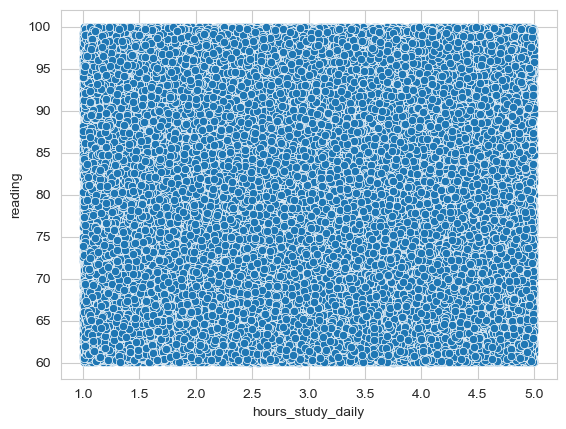

In [19]:
sns.scatterplot(data = df, x = 'hours_study_daily', y = 'reading')

The pair plots are not showing any relationship between the numerical columns.
Let's plot some numerical categories with performance.

In [21]:
df['performance'].unique()

array(['Low', 'Medium', 'High'], dtype=object)

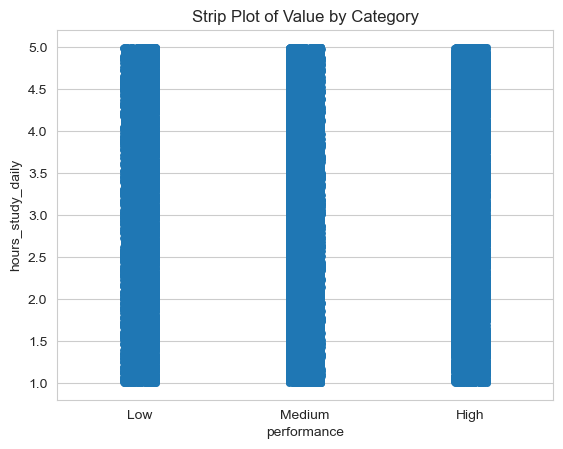

In [22]:
sns.stripplot(x='performance', y='hours_study_daily', data=df, order=['Low', 'Medium', 'High'], jitter=True)
plt.title('Strip Plot of Value by Category')
plt.show()

In [ ]:
df = student_data

In [ ]:
plt.bar(x = df['performance'], height = df['hours_study_daily'])
plt.show()        

There does not appear to be any relationship between hours spend studying daily and student performance.

In [ ]:
plt.bar(x = df['performance'], height = df['previous_performance'])
plt.show()

There does appear to be a relationship between previous performance and student performance.

In [ ]:
plt.bar(x = df['performance'], height = df['sleep'])
plt.show()

There does not appear to be a relationship between sleep or any of the following categories and student performance.

In [ ]:
plt.bar(x = df['gender'], height = df['math'])
plt.show()

In [ ]:
plt.bar(x = df['parent_education'], height = df['math'])
plt.show()

In [ ]:
plt.bar(x = df['parent_involvement'], height = df['math'])
plt.show()

In [ ]:
plt.bar(x = df['activities'], height = df['math'])
plt.show()

Start making bar charts that compare each non-numerical independent variable to reading, math, science and language.

In [ ]:
# Melt the subject columns 
subject_cols = ['reading', 'math', 'science', 'language']
df_long = df.melt(id_vars = ['gender', 'age', 'grade', 'attendance', 'parent_education', 'parent_involvement', 'activities', 'socioeconomic_status', 'class_participation',
             'health', 'resources', 'internet', 'learning_style', 'teacher_relationship', 'peer_influence', 'motivation', 'diet', 'transportation', 
             'school_type', 'school_location', 'physical_activity', 'special_education', 'counseling', 'learning_disabilities', 
             'behavioral_issues', 'tutored', 'school_climate', 'parents_employment'], value_vars = subject_cols, var_name = 'subject', value_name = 'score')


In [ ]:
# Plot grouped by socioeconomic status
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'socioeconomic_status', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Socioeconomic Status')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'class_participation', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Socioeconomic Status')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'health', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Health Status')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'resources', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Access to Learning Resources')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'internet', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Access to Internet')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'learning_style', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Learning Style')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'teacher_relationship', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Teacher Student Relationship')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'peer_influence', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Peer Influence')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'motivation', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Motivation')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'diet', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Diet')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'transportation', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Transportation')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'school_type', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by School Type')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'school_location', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by School Location')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'physical_activity', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Physical Activity')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'special_education', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Special Education Status')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'counseling', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Counseling Status')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'learning_disabilities', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Learning Disabilities')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'behavioral_issues', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Behavioral Issues')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'tutored', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Attendance at Tutoring Sessions')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'school_climate', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by School Climate')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'parents_employment', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Employment Status of Parents')
plt.show()

In [ ]:
plt.figure(figsize = (10, 6))
sns.barplot(data = df_long, x = 'attendance', y = 'score', hue = 'subject')
plt.title('Proficiency Scores by Attendance')
plt.show()